# Rotation/ Deskewing

In [18]:
# Import openCV library
import cv2
import matplotlib.pyplot as plt
import numpy as np

#### Function to display image

In [8]:
#https://stackoverflow.com/questions/28816046/
# Displaying different images with actual size in matplotlib

def display_image_original_size(im_data):
    
    # dpi stands for "dots per inches", it is a measure of the resolution of the image
    # In this it will be used to calculate the size of the figure needed to display the image at its actual size
    dpi = 80 
    
    # Get the height as number of rows(Image height in numpy array) and width as number of columns(Image width in the numpy array)
    # SHape function will give a tupe with number of rows, column and image type(RGB or not) we need only first 2 values for our function
    height, width = im_data.shape[:2]
    
    # what size does the figure need to be in inches to fit the image
    figsize = width / float(dpi), height/float(dpi)
    
    # Create a figure of the right size with oneaxes  that takes up the full figure
    fig = plt.figure(figsize=figsize) # Create new matplotlib figur with the specified size
    # Denotes the axes which the figure entirely occupy here, it startes from bottom-left corner(0,0) and goes upto top-right corner(1.1)
    ax = fig.add_axes([0,0,1,1])
    
    # Hide spines, ticks, etc.
    #This line removes the axis lines, ticks, and labels from the plot, making the image the sole focus of the display
    ax.axis('off')
    
    # Display the image in grayscale
    ax.imshow(im_data, cmap = 'gray')
    
    plt.show()

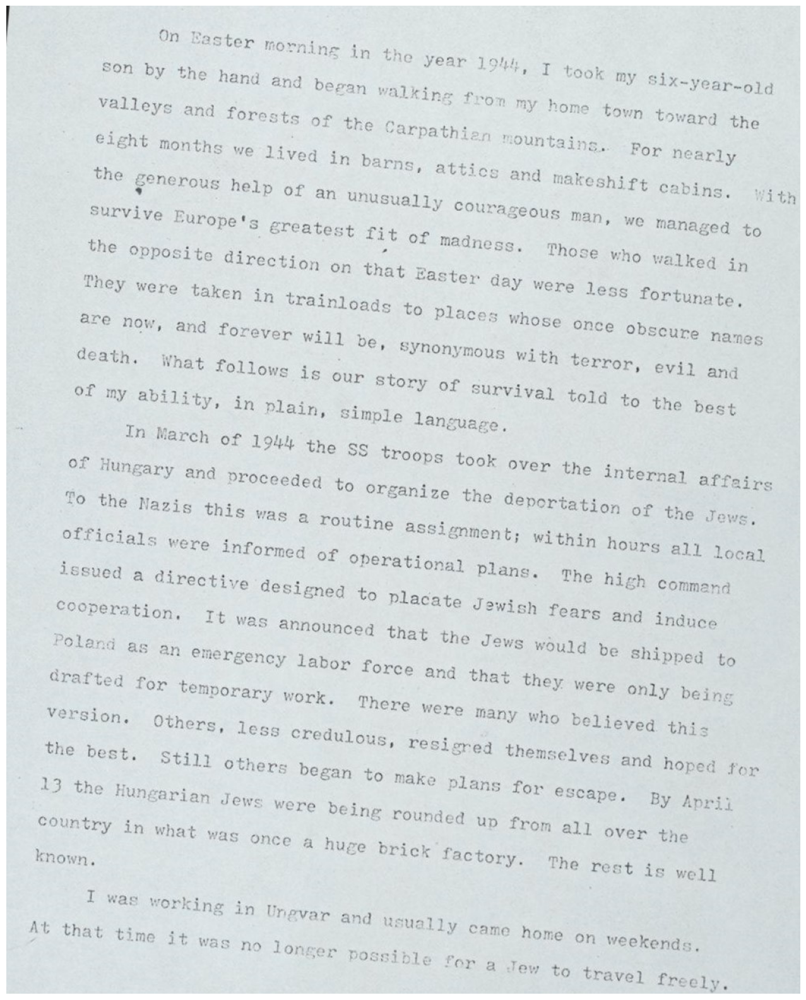

In [9]:
new = cv2.imread("page_01_rotated.JPG")
display_image_original_size(new)

#### Function to deskewing the image
https://becominghuman.ai/how-to-automatically-deskew-straighten-a-text-image-using-opencv-a0c30aed83df

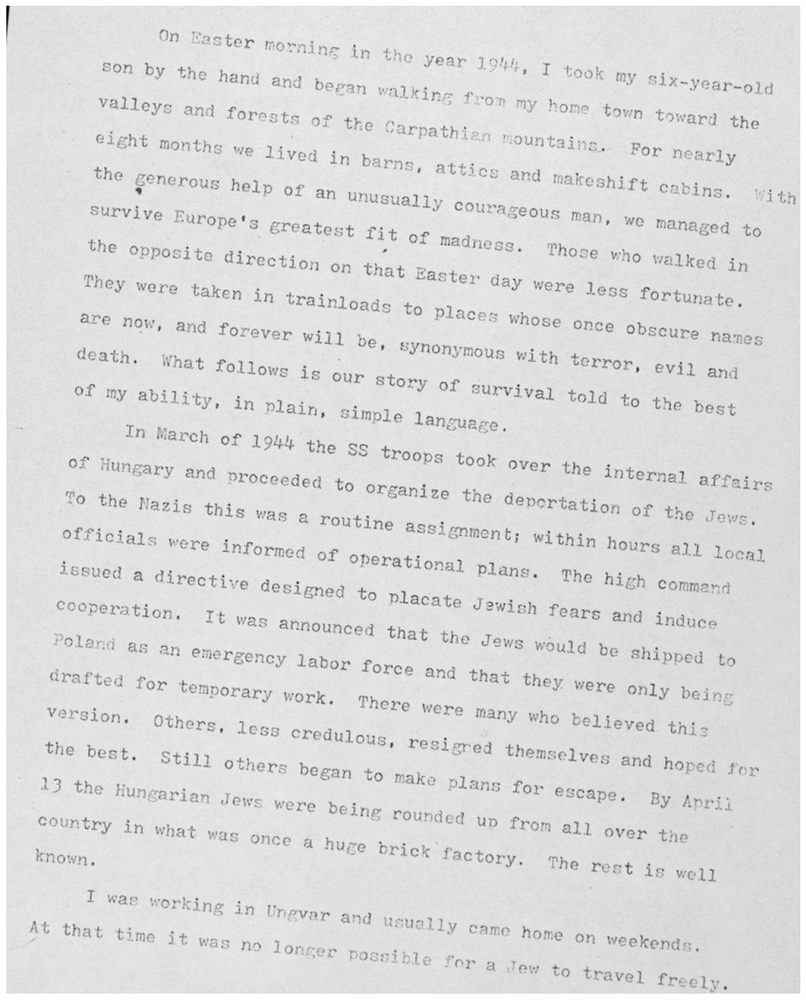

In [11]:
# Step 1: Covert the Grayscale
gray = cv2.cvtColor(new, cv2.COLOR_BGR2GRAY)
display_image_original_size(gray)

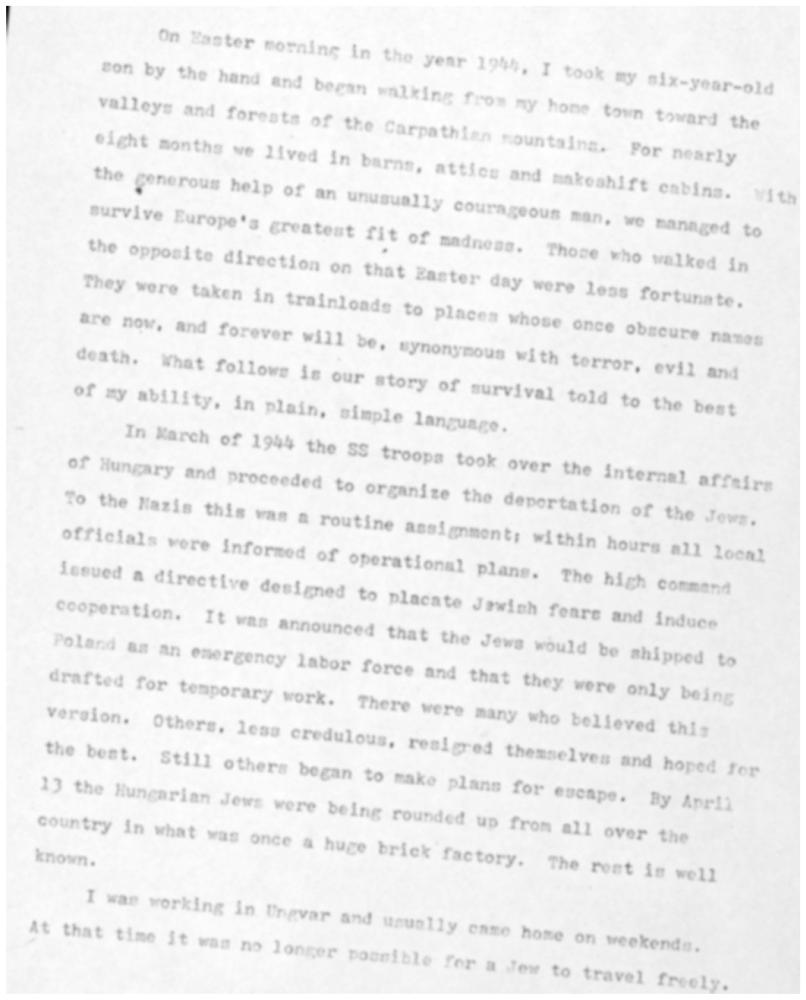

In [12]:
#Step 2: Apply Guassian Blur
blur = cv2.GaussianBlur(gray, (9,9),0)
#Gaussian blur is applied to the grayscale image to reduce noise and details, 
# which can help in better contour detection.
display_image_original_size(blur)

#### Explaination of below function threshold
thresh = cv2.threshold(blur, 0,255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

blur: The input image, which should be a grayscale image (already processed in previous steps).

0: The threshold value. Normally, pixel values below this threshold would be set to 0. However, in this case, because of the cv2.THRESH_OTSU flag, this value is ignored, and the optimal threshold is determined automatically by the Otsu's method.

255: The maximum value to use with the THRESH_BINARY and THRESH_BINARY_INV thresholding types. Pixels that meet the threshold condition are set to this value, which is 255. In grayscale images, 255 represents the color white.

cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU: This is a combination of two thresholding types:

cv2.THRESH_BINARY_INV: Inverse binary thresholding. In this mode, pixel values above the threshold are set to 0, and those below are set to 255. This is the inverse of normal binary thresholding.

cv2.THRESH_OTSU: Otsu’s method automatically determines the optimal threshold value (T) for binarization. When this flag is used, the 0 in the threshold parameter is ignored, and OpenCV calculates the best threshold value based on the image histogram.


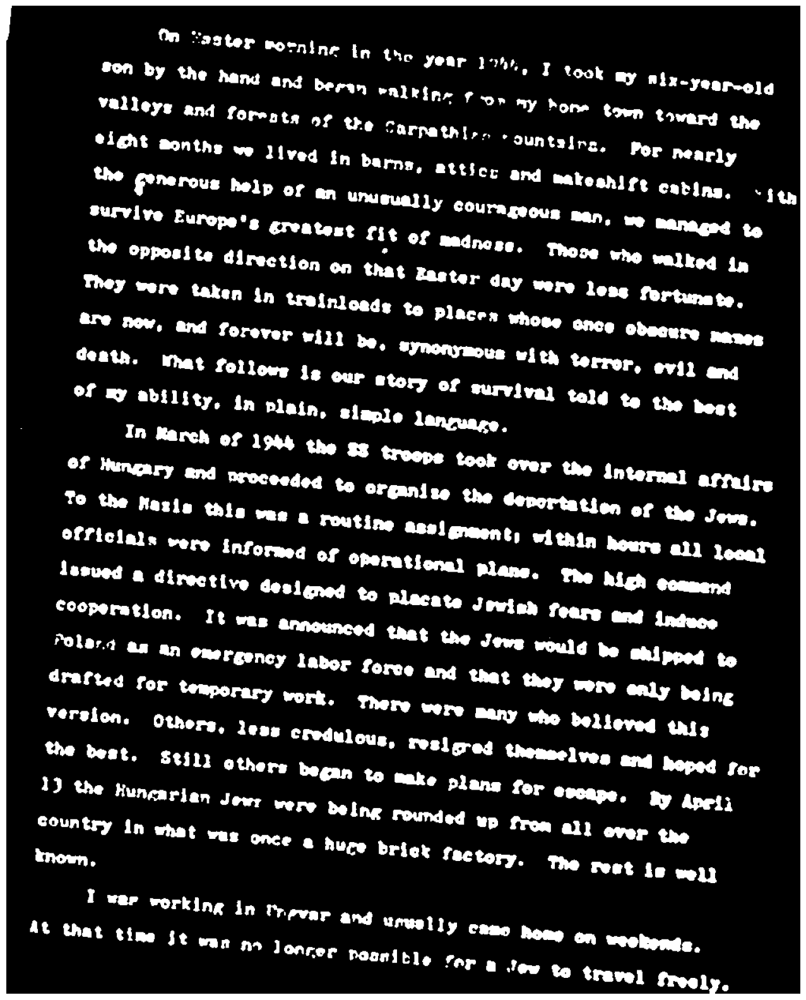

In [13]:
# Step 3: Apply threshold
thresh = cv2.threshold(blur, 0,255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

display_image_original_size(thresh)

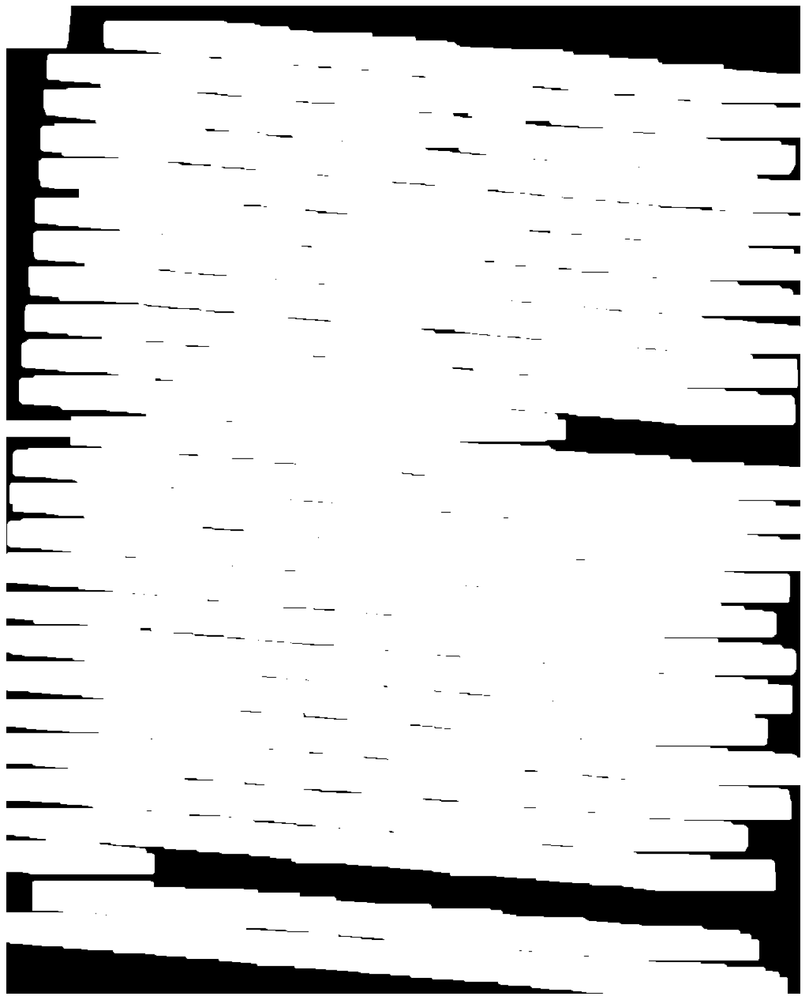

In [14]:

# Step 4: Dilate to merge text lines/paragraphs
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30,5))
dilate = cv2.dilate(thresh, kernel, iterations=5)

display_image_original_size(dilate)

#### Explaination of step 4
A rectangular structuring element (kernel) of size 30x5 is created. This kernel is wider on the X-axis and narrower on the Y-axis.

Dilation is applied to the thresholded image using the created kernel. Dilation expands the white regions in the image, helping to merge individual characters into lines or paragraphs. 


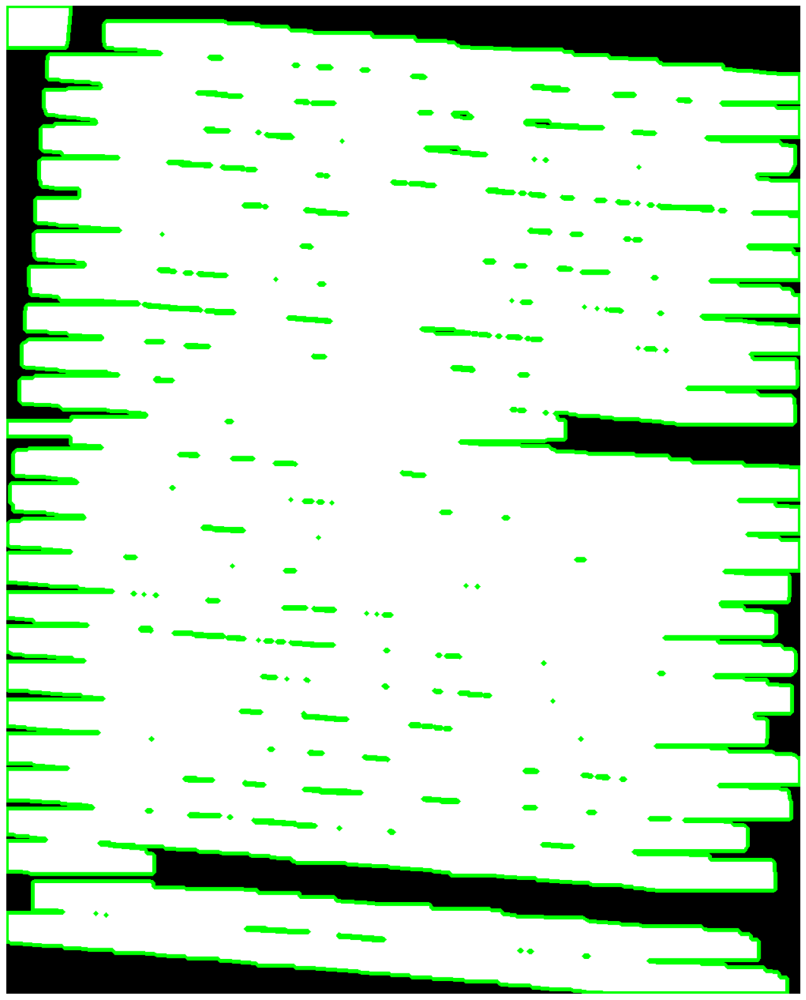

In [15]:
# STep 5: Find Contours
contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
contours = sorted(contours, key = cv2.contourArea, reverse=True)

# DIsplay the contours on the image
contour_image = cv2.cvtColor(dilate, cv2.COLOR_GRAY2BGR)
cv2.drawContours(contour_image, contours, -1, (0,255,0),3)
# contour_image: The image on which to draw the contours.
# contours: The list of contours you found earlier.
# -1: Indicates that all contours should be drawn. If you want to draw a specific contour, replace -1 with the index of the contour.
# (0, 255, 0): The color of the contours (green in this case).
# 3: The thickness of the contour lines.

display_image_original_size(contour_image)


#### Explaination of step 5
cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE): This function finds the contours in the dilated image. Contours are curves joining continuous points along a boundary with the same color or intensity.

contours = sorted(contours, key=cv2.contourArea, reverse=True): The contours are sorted in descending order based on their area. The largest contour is assumed to be the main body of text.


In [16]:
# STep 6: FInd largest contours and surround in min area box
largestContour = contours[0]
minAreaRect = cv2.minAreaRect(largestContour)
minAreaRect

((507.4606018066406, 568.4118041992188),
 (1016.865966796875, 1086.1143798828125),
 1.5188504457473755)

cv2.minAreaRect(largestContour): A minimum area rectangle is fitted around the largest contour. This rectangle is the smallest rectangle that can enclose the contour and can be rotated.


C:\Users\subit\AppData\Local\Temp\ipykernel_21072\842495943.py:3: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)


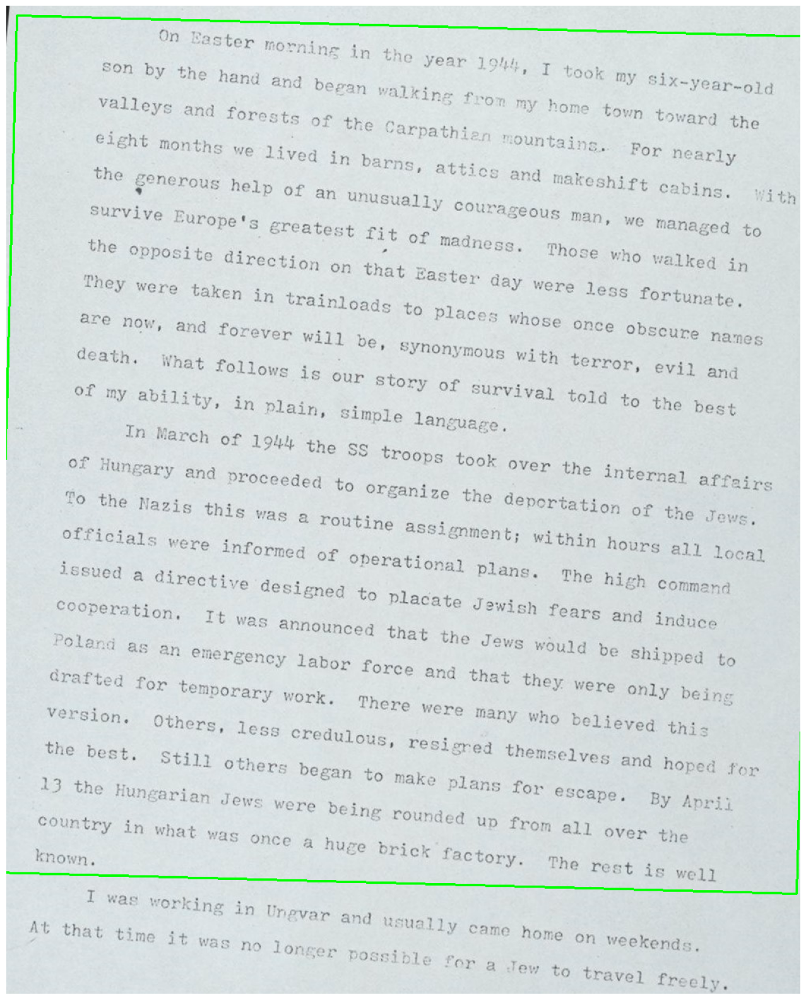

In [19]:
# Draw the minimum  area rectangle on the image
box = cv2.boxPoints(minAreaRect)
box = np.int0(box)
cvImageWithBox = new.copy()
cv2.drawContours(cvImageWithBox, [box], 0, (0,255,0), 2)

display_image_original_size(cvImageWithBox)

In [20]:
# Step 7: Determinne the Skew Angle
angle = minAreaRect[-1]
print(angle)
if angle < -45:
    angle = 90+angle
print(-1.0 * angle)


1.5188504457473755
-1.5188504457473755


angle = minAreaRect[-1]: The angle of the rectangle is extracted. This angle represents the skew of the text.

if angle < -45: If the angle is less than -45 degrees, the function adds 90 degrees to it. This adjustment ensures the angle is within a reasonable range (between -45 and 45 degrees).

return -1.0 * angle: The angle is inverted and returned. The inversion is done to correct the skew in the opposite direction of the detected skew.


In [21]:
# COmbine all 7 steps in single function

def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle


In [22]:
# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    # Create a copy of the image
    newImage = cvImage.copy()
    # Get the height and width of the image
    (h, w) = newImage.shape[:2]
    # Calculate the center coordinates
    center = (w // 2, h // 2)
    
    # Generate a rotation matrix 'M' that will be used to rotate the image
    # center: The point around which the image will be rotated.
    # angle: The rotation angle in degrees. Positive values rotate counterclockwise, and negative values rotate clockwise.
    # 1.0: The scaling factor (1.0 means no scaling, the image will retain its size).
    
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    
    # APply rotation to the image
    
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    
    # newImage: The image to be rotated.
    # M: The rotation matrix obtained from cv2.getRotationMatrix2D.
    # (w, h): The dimensions of the output image (same as the original).
    # flags=cv2.INTER_CUBIC: Specifies the interpolation method used for rotating the image. INTER_CUBIC is a high-quality interpolation method.
    # borderMode=cv2.BORDER_REPLICATE: Defines how the border pixels are handled. BORDER_REPLICATE replicates the border pixels of the image to fill any gaps that might appear after rotation.
    
    return newImage



Interpolation in the context of image processing is a method used to estimate pixel values at non-integer coordinates in an image. This is necessary during operations like rotation, scaling, and warping, where the new positions of pixels after transformation may not align with the original grid of pixels. For instance, rotating an image by an arbitrary angle can result in a situation where the new pixel locations don't correspond to exact integer positions in the original image. Interpolation is used to estimate the values of these new pixel positions by considering the values of surrounding pixels.
cv2.INTER_CUBIC: The value of the new pixel is calculated as a weighted average of the 16 closest pixels using cubic polynomials.

In [23]:

# Deskew the image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)


28


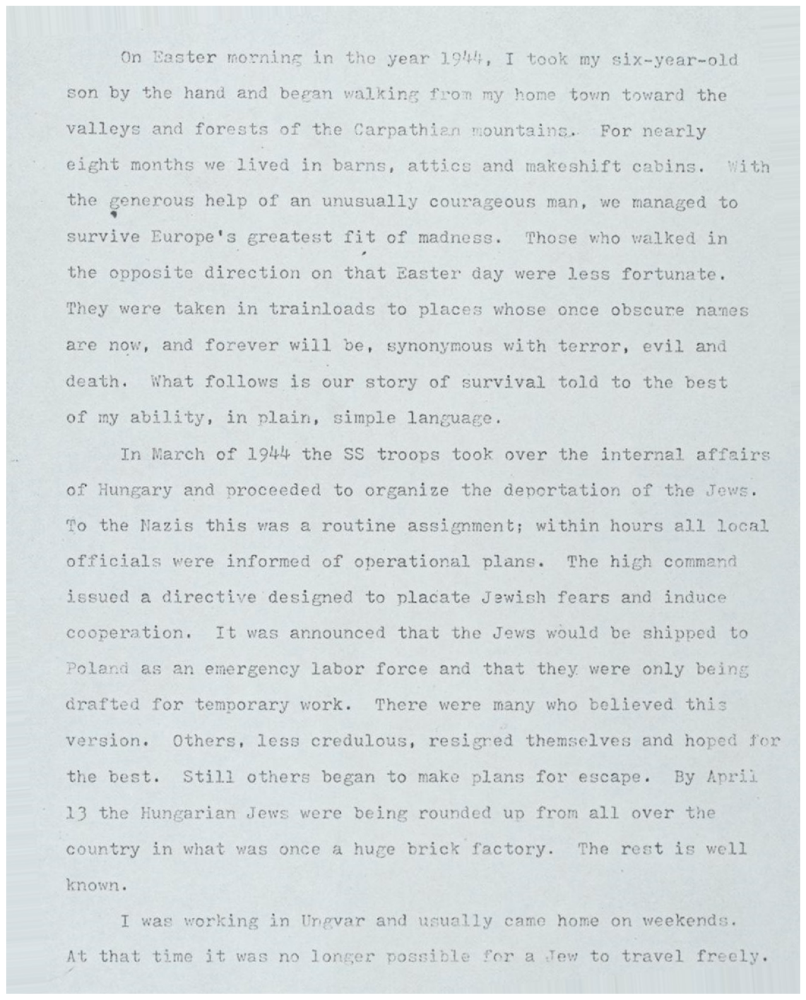

In [24]:

fixed = deskew(new)

display_image_original_size(fixed)